In [1]:
import pandas as pd
import plotly.graph_objects as go
import plotly.figure_factory as ff
import numpy as np
import logging
from os.path import exists
from typing import Tuple, Optional
import matplotlib.pyplot as plt
import seaborn as sns

# Set up logging for better error tracing and debugging
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')
logger = logging.getLogger(__name__)

# Constants for colors
LINE_COLORS = ['yellow', 'green', 'red', 'blue']
ARROW_COLORS = ['black', 'black', 'black', 'black']

In [2]:
class DataLoader:
    def load_data(self, file_path: str, rows: int = 0) -> pd.DataFrame | None:
        '''Loads data from a CSV file and returns a DataFrame.
        
        Args:
            file_path (str): The path to the CSV file.
            rows (int, optional): The number of rows to read from the file. Defaults to 0.
        
        Returns:
            df (pd.DataFrame | None): The DataFrame containing the data. None if the file could not be loaded.
        '''
        if not exists(file_path):
            logger.error("Incorrect file path provided.")
            return None
        try:
            df = pd.read_csv(file_path, skiprows=2, nrows=rows if rows else None, low_memory=True, parse_dates=[[0,1]]) # parse_dates - combine column 0 and 1 into a datetime object
            if df is None or df.empty:
                logger.error("Empty DataFrame loaded on load_data().")
                return None
            df = df.drop(columns=['Unnamed: 80'], errors='ignore')
            logger.info("Data loaded successfully.")
            return df
        except Exception as e:
            logger.error(f"Failed to load data: {e}")
            return None

data_loader = DataLoader()
df = data_loader.load_data('./data/DataSheet_1819011001_3P4W_3.csv', rows=0)
df

C:\Users\dionisiy\AppData\Local\Temp\ipykernel_9288\2591245091.py:16: FutureWarning: Support for nested sequences for 'parse_dates' in pd.read_csv is deprecated. Combine the desired columns with pd.to_datetime after parsing instead.
  df = pd.read_csv(file_path, skiprows=2, nrows=rows if rows else None, low_memory=True, parse_dates=[[0,1]]) # parse_dates - combine column 0 and 1 into a datetime object
2024-11-02 14:12:36,475 - INFO - Data loaded successfully.


,Date_Time,UA,UB,UC,UAvg,UTHA,UTHB,UTHC,UTHAvg,IA,...,PDmIAVG_D/T,DmP,PDmP,PDmP_D/T,DmQ,PDmQ,PDmQ_D/T,DmS,PDmS,PDmS_D/T
0,2024-09-02 11:15:27,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,87.06,...,2019-03-29 08:54:05,0.0,56863.97,2020-05-07 18:11:03,0.0,14908.75,2020-05-12 15:53:10,0.0,75434.29,2019-03-29 08:54:20
1,2024-09-02 11:15:27,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,86.97,...,2019-03-29 08:54:05,0.0,56863.97,2020-05-07 18:11:03,0.0,14908.75,2020-05-12 15:53:10,0.0,75434.29,2019-03-29 08:54:20
2,2024-09-02 11:15:28,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,87.00,...,2019-03-29 08:54:05,0.0,56863.97,2020-05-07 18:11:03,0.0,14908.75,2020-05-12 15:53:10,0.0,75434.29,2019-03-29 08:54:20
3,2024-09-02 11:15:29,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,86.62,...,2019-03-29 08:54:05,0.0,56863.97,2020-05-07 18:11:03,0.0,14908.75,2020-05-12 15:53:10,0.0,75434.29,2019-03-29 08:54:20
4,2024-09-02 11:15:30,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,81.15,...,2019-03-29 08:54:05,0.0,56863.97,2020-05-07 18:11:03,0.0,14908.75,2020-05-12 15:53:10,0.0,75434.29,2019-03-29 08:54:20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
117153,2024-10-30 11:37:32,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.79,...,2019-03-29 08:54:05,0.0,56863.97,2020-05-07 18:11:03,0.0,14908.75,2020-05-12 15:53:10,0.0,75434.29,2019-03-29 08:54:20
117154,2024-10-30 11:37:33,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.76,...,2019-03-29 08:54:05,0.0,56863.97,2020-05-07 18:11:03,0.0,14908.75,2020-05-12 15:53:10,0.0,75434.29,2019-03-29 08:54:20
117155,2024-10-30 11:37:34,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.42,...,2019-03-29 08:54:05,0.0,56863.97,2020-05-07 18:11:03,0.0,14908.75,2020-05-12 15:53:10,0.0,75434.29,2019-03-29 08:54:20
117156,2024-10-30 11:37:35,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.40,...,2019-03-29 08:54:05,0.0,56863.97,2020-05-07 18:11:03,0.0,14908.75,2020-05-12 15:53:10,0.0,75434.29,2019-03-29 08:54:20


In [3]:
class DataProcessor:
    def preprocess(self, df: pd.DataFrame) -> pd.DataFrame:
        '''Preprocesses the data by:
        - taking the absolute values of the power columns.
        
        Args:
            df (pd.DataFrame): The DataFrame containing the data.
        
        Returns:
            df (pd.DataFrame): The preprocessed DataFrame.
        '''
        if df is None or df.empty:
            logger.error("No DataFrame provided to preprocess.")
            return pd.DataFrame()
        try:
            df[['PA', 'PB', 'PC']] = df[['PA', 'PB', 'PC']].abs() # taking aboslute values to remove negative values
            logger.info("Data preprocessing completed.")
            return df
        except KeyError as e:
            logger.error(f"Preprocessing failed due to missing columns: {e}")
            return pd.DataFrame()

processor = DataProcessor()
df_og = processor.preprocess(df)
df = df_og

2024-11-02 14:12:36,546 - INFO - Data preprocessing completed.


In [10]:

class Plotter:
    def __init__(self):
        self.fig = None

    def plot_time_series(self, df: pd.DataFrame, columns: list, title: str, min_max_arrows: bool = False, start_date: str = None, end_date: str = None):
        '''Plots a time series chart for the given columns.
        
        Args:
            df (pd.DataFrame): The DataFrame containing the data.
            columns (list): A list of column names to plot.
            title (str): The title of the chart.
            min_max_arrows (bool, optional): Whether to add min and max arrows to the chart. Defaults to False.
        '''
        if df is None or df.empty:
            logger.error("Empty DataFrame provided to plot on time series chart.")
            return

        df = self._filter_date_range(df, start_date, end_date)
        df = self._fill_missing_time_with_zeros(df, columns)

        self.fig = go.Figure()
        for idx, col in enumerate(columns):
            self.fig.add_trace(go.Scatter(x=df['Date_Time'], y=df[col], mode='lines', name=col, line=dict(color=LINE_COLORS[idx])))

        self.fig.update_layout(
            title=title,
            xaxis_title='Date and Time',
            yaxis_title='Values',
            hovermode='closest',
            title_font=dict(size=12, color='black')
        )

        if min_max_arrows:
            self._add_min_max_arrows(df, columns)

        self.fig.show()
    
    def _filter_date_range(self, df: pd.DataFrame, start_date: str = None, end_date: str = None) -> pd.DataFrame:
        if df is None or df.empty:
            logger.error("Empty DataFrame provided to filter date range.")
            return pd.DataFrame()
        
        if start_date or end_date:
            try:
                df_copy = df.copy()
                
                if start_date:
                    start_date = pd.to_datetime(start_date)
                    df_copy = df_copy[(df['Date_Time'] >= start_date)]
                
                if end_date:
                    end_date = pd.to_datetime(end_date)
                    df_copy = df_copy[(df['Date_Time'] <= end_date)]
                
                return df_copy
            except ValueError as e:
                logger.error(f"Failed to filter date range: {e}")
                return df

    def _fill_missing_time_with_zeros(self, df: pd.DataFrame, columns: list) -> pd.DataFrame:
        '''Fills missing datetime values with zeros, especially for gaps greater than 2 hours.'''
        if 'Date_Time' not in df.columns:
            logger.error("DataFrame does not contain 'Date_Time' column for filling missing times.")
            return df

        try:
            df['Date_Time'] = pd.to_datetime(df['Date_Time'])

            # Sort by Date_Time to ensure proper gap calculation
            df = df.sort_values(by='Date_Time').reset_index(drop=True)

            # Identify gaps
            df['Time_Diff'] = df['Date_Time'].diff()
            
            # Create a DataFrame for the new zero-filled rows
            zero_fill_rows = []

            for i in range(1, len(df)):
                if df['Time_Diff'].iloc[i] and df['Time_Diff'].iloc[i] > pd.Timedelta(hours=2):
                    start_time = df['Date_Time'].iloc[i - 1]
                    end_time = df['Date_Time'].iloc[i]

                    # Create new timestamps for 2-hour intervals within the gap
                    current_time = start_time + pd.Timedelta(hours=2)

                    while current_time < end_time:
                        zero_fill_row = {col: 0 for col in columns}  # Fill zeros for specified columns
                        zero_fill_row['Date_Time'] = current_time
                        zero_fill_rows.append(zero_fill_row)
                        current_time += pd.Timedelta(hours=2)  # Move to the next 2-hour interval

            # Convert zero_fill_rows to a DataFrame
            if zero_fill_rows:
                zero_fill_df = pd.DataFrame(zero_fill_rows)
                df = pd.concat([df, zero_fill_df], ignore_index=True)

            # Remove duplicates, fill missing columns with zeros, and sort again
            df = df.drop_duplicates(subset='Date_Time')
            df = df.sort_values(by='Date_Time').reset_index(drop=True)

            # Ensure that missing columns are added with zeros
            # for col in columns:
            #     if col not in df.columns:
            #         df[col] = 0
            #     df[col].fillna(0, inplace=True)

            # Drop the Time_Diff column as it's no longer needed
            df.drop(columns=['Time_Diff'], inplace=True)

            return df

        except Exception as e:
            logger.error(f"Failed to fill missing time with zeros: {e}")
            return df


    def _add_min_max_arrows(self, df: pd.DataFrame, columns: list):
        for idx, col in enumerate(columns):
            try:
                # Create a mask to filter out rows where the specified column value is less than or equal to 0
                mask = df[col] > 0.01
                
                # Use this mask to find the max and min rows while keeping Date_Time intact
                if mask.any():  # Check if there are any valid rows to work with
                    max_row = df[mask].loc[df[mask][col].idxmax()]
                    min_row = df[mask].loc[df[mask][col].idxmin()]
                    max_value = max_row[col]
                    min_value = min_row[col]

                    self._add_annotation(max_row, col, idx, max_value, "Max")
                    self._add_annotation(min_row, col, idx, min_value, "Min")
                else:
                    logger.warning(f"No valid data found for {col} greater than 0.01")
            except ValueError as e:
                logger.warning(f"Error finding max/min for {col}: {e}")

    def _add_annotation(self, row: pd.Series, col: str, idx: int, value: float, label: str):
        '''Adds a formatted annotation to the plot.'''
        self.fig.add_annotation(
            text=f'<b>{label}:</b><br>{col} = {value:.2f}',  # Improved formatting for clarity
            x=row['Date_Time'],
            y=row[col],
            showarrow=True,
            arrowhead=2,
            arrowsize=1.5,
            arrowwidth=2,
            arrowcolor=ARROW_COLORS[idx],
            ax=0,  # Center arrow horizontally
            ay=-40,  # Maintain vertical offset
            font=dict(size=12, color='black'),  # Make font color more neutral for readability
            bgcolor='rgba(255, 255, 255, 0.66)',  # Semi-transparent white background for better contrast
            bordercolor='black',  # Border color for annotation box
            borderwidth=1,  # Border width for annotation box
            borderpad=3  # Padding inside the annotation box
        )

    def plot_gaussian_distribution(self, df: pd.DataFrame, columns: list, title: str, start_date: str = None, end_date: str = None):
        '''Plots a Gaussian distribution chart for the given columns.'''
        if df is None or df.empty:
            logger.error("Empty DataFrame provided for Gaussian distribution plot.")
            return

        # Filter the DataFrame by date range
        df = self._filter_date_range(df, start_date, end_date)

        # Set up the matplotlib figure
        plt.figure(figsize=(10, 6))

        # Loop through the specified columns and plot each
        for col in columns:
            # Check if the column exists in the DataFrame
            if col in df.columns:
                # Plot the kernel density estimate
                sns.kdeplot(data=df[col], label=col, fill=True)

        # Update layout
        plt.title(title, fontsize=14)
        plt.xlabel('Value', fontsize=12)
        plt.ylabel('Density', fontsize=12)
        plt.legend(title='Columns', fontsize=10)
        plt.grid(True)
        plt.show()


# create a Plotter instance
plotter = Plotter()

In [5]:
plotter.plot_time_series(df, columns=['IA', 'IB', 'IC'], title="Current Timeline", min_max_arrows=True, start_date='2024-10-01')
# plotter.plot_time_series(df, columns=['PA', 'PB', 'PC'], title="Power Timeline", min_max_arrows=True)

C:\Users\dionisiy\AppData\Local\Temp\ipykernel_9288\3999984358.py:55: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



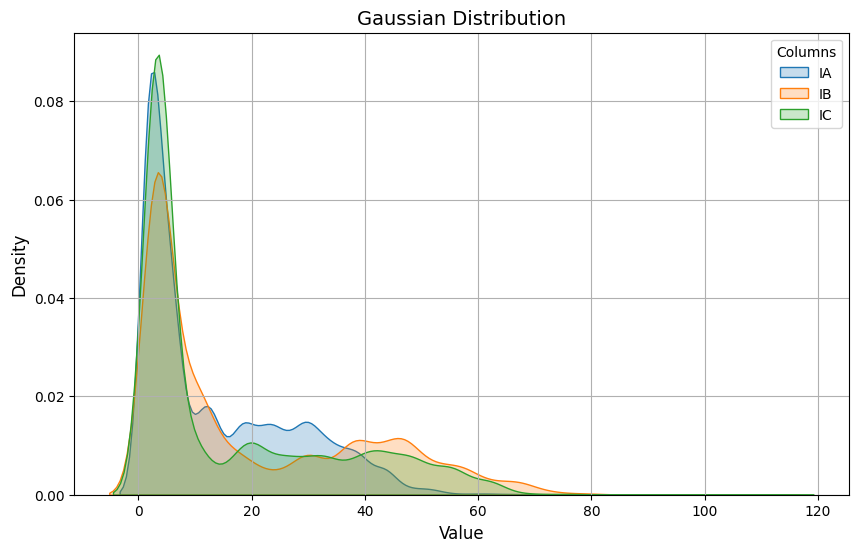

In [11]:
plotter.plot_gaussian_distribution(df, columns=['IA', 'IB', 'IC'], title='Gaussian Distribution', start_date='2024-10-20, 14:00', end_date='2024-10-23, 14:00')

# plotter.plot_gaussian_distribution(df, columns=['IA', 'IB', 'IC'], title='Gaussian Distribution', start_date='2024-10-20, 14:00', end_date='2024-10-23, 14:00')

In [27]:
class DescriptiveStats:
    @staticmethod
    def describe(df: pd.DataFrame) -> Tuple[dict, dict, float]:
        if df.empty:
            logger.error("Empty DataFrame provided for descriptive statistics.")
            return {}, {}, 0.0

        # Create dictionaries for max and min values
        max_vals = {}
        min_vals = {}

        # List of columns to evaluate
        columns_to_evaluate = ['IA', 'IB', 'IC', 'UA', 'UB', 'UC', 'PA', 'PB', 'PC', 'ITHA', 'ITHB', 'ITHC', 'ITHAvg']

        # Calculate descriptive statistics
        for key in columns_to_evaluate:
            if key in df.columns:
                # Check if the column has non-zero values
                if (df[key] != 0).any():
                    # Calculate max and min excluding zeroes
                    max_vals[key] = float(df[key].max())
                    min_vals[key] = float(df[key][df[key] > 0].min())  # Min excluding zero
                else:
                    # If all values are zero
                    max_vals[key] = 0.0
                    min_vals[key] = 0.0  # Min is zero since all values are zero

        p_max_sum = sum(max_vals.get(f'P{phase}', 0) for phase in 'ABC')

        logger.info("Descriptive statistics calculated.")
        return max_vals, min_vals, p_max_sum

stats = DescriptiveStats()
max_vals, min_vals, p_max_sum = stats.describe(df)
print(pd.DataFrame({'max': max_vals, 'min': min_vals}))
print(f'Power max sum: {p_max_sum}')

2024-11-02 14:24:32,209 - INFO - Descriptive statistics calculated.


              max      min
IA        103.760    0.500
IB        109.100    0.500
IC        112.190    0.510
UA        243.270  205.280
UB        248.040  207.430
UC        243.420  211.900
PA      17608.650   72.680
PB      20911.780    0.830
PC      20501.210  176.990
ITHA      212.005    0.861
ITHB      249.354    1.063
ITHC      173.947    0.527
ITHAvg     90.369    1.113
Power max sum: 59021.64
